<a href="https://colab.research.google.com/github/XavierCarrera/linear_algebra_machine_learning/blob/master/SVD_Applications_to_an_Image.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import urllib.request as request

%matplotlib inline

# Image as a Matrix

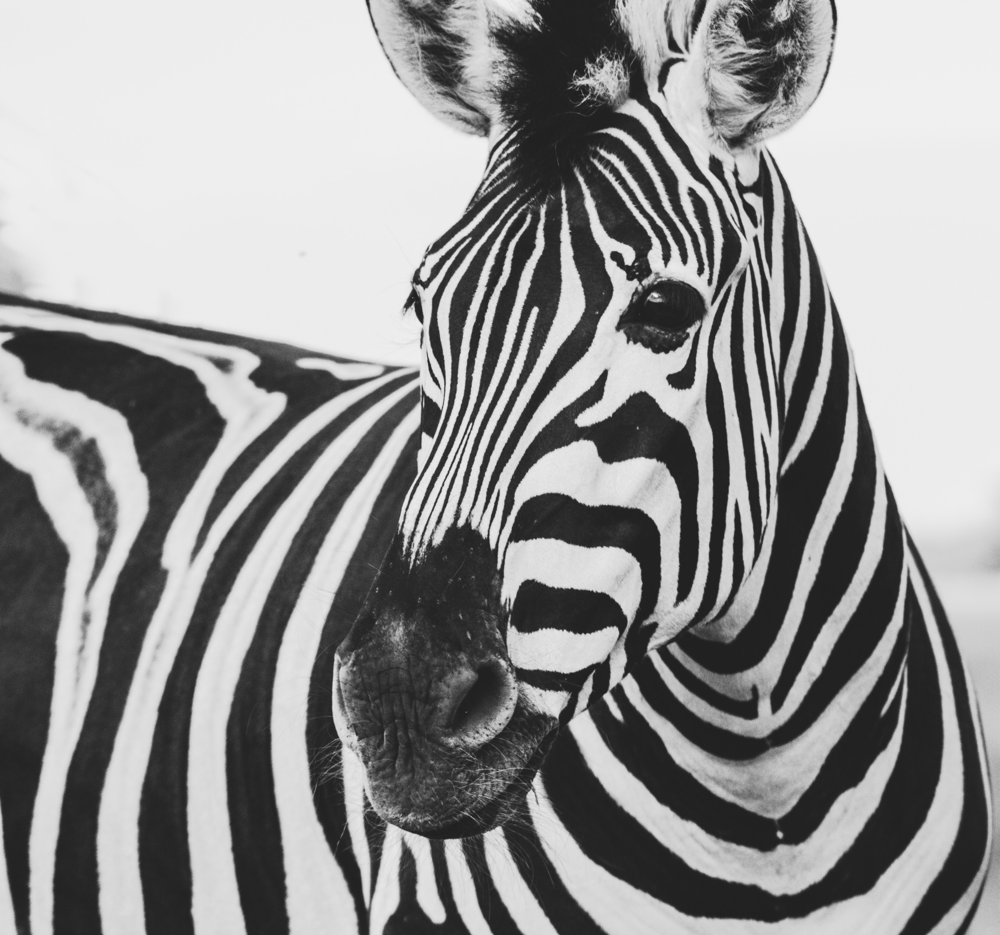

In [ ]:
url = "https://static.platzi.com/media/tmp/class-files/git/algebra-aplicada/algebra-aplicada-master/02%20-%20Aplicacion%20de%20SVD%20a%20una%20imagen/imagenes/imagen_ejemplo_frida_bredesen.jpg"
image = request.urlretrieve(url, "test.jpg")
img = Image.open(image[0])
img

In [ ]:
img_gr = img.convert("LA")
print(img_gr)

<PIL.Image.Image image mode=LA size=3693x3456 at 0x7F8BEB7827B8>


In [ ]:
img_mat = np.array(list(img_gr.getdata(band=0)), float)
print(img_mat)

[236. 236. 235. ... 195. 195. 193.]


In [ ]:
img_mat.shape = (img_gr.size[1], img_gr.size[0])
print(img_mat)

[[236. 236. 235. ... 239. 239. 239.]
 [236. 236. 235. ... 239. 239. 239.]
 [236. 236. 235. ... 238. 238. 238.]
 ...
 [217. 216. 216. ... 197. 196. 194.]
 [216. 216. 216. ... 196. 195. 193.]
 [216. 216. 216. ... 195. 195. 193.]]


In [ ]:
print(img_mat.shape)

(3456, 3693)


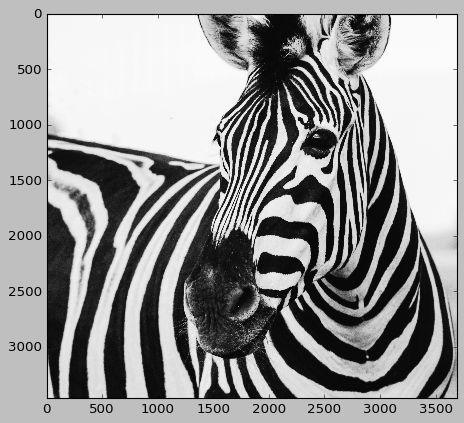

In [ ]:
plt.imshow(img_mat, cmap = "gray")
plt.show()

In [ ]:
img_mat_2 = img_mat / 10
print(img_mat_2)

[[23.6 23.6 23.5 ... 23.9 23.9 23.9]
 [23.6 23.6 23.5 ... 23.9 23.9 23.9]
 [23.6 23.6 23.5 ... 23.8 23.8 23.8]
 ...
 [21.7 21.6 21.6 ... 19.7 19.6 19.4]
 [21.6 21.6 21.6 ... 19.6 19.5 19.3]
 [21.6 21.6 21.6 ... 19.5 19.5 19.3]]


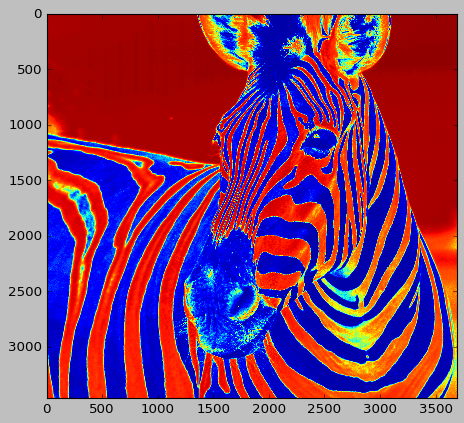

In [ ]:
plt.imshow(img_mat_2)

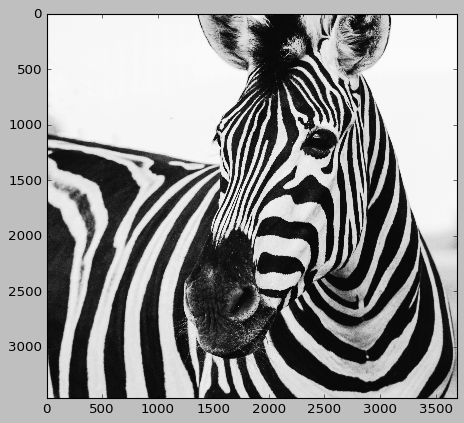

In [ ]:
plt.imshow(img_mat_2, cmap="gray")
plt.show()

In [ ]:
print(np.max(img_mat_2))
print(np.max(img_mat))

24.4
244.0


# SVD Decomposition of an Image

In [ ]:
img_mat.shape = (img_gr.size[1], img_gr.size[0])

In [ ]:
U, D, V = np.linalg.svd(img_mat)

In [ ]:
print(img_mat.shape)
print(U.shape)
print(D.shape)
print(V.shape)

(3456, 3693)
(3456, 3456)
(3456,)
(3693, 3693)


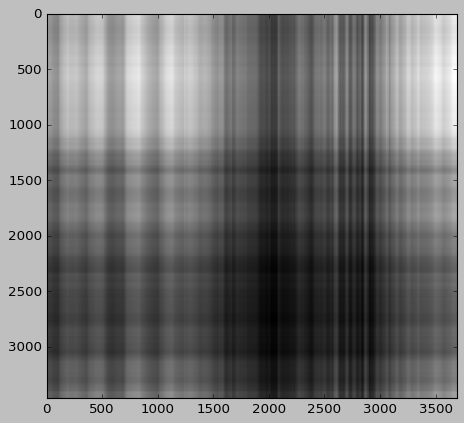

In [ ]:
img_recons = np.matrix(U[:, :1]) * np.diag(D[:1]) * np.matrix(V[:1,:])
plt.imshow(img_recons, cmap = "gray")

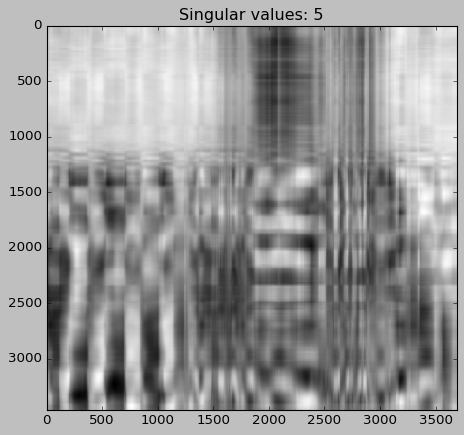

In [ ]:
i = 5
img_recons = np.matrix(U[:, :i]) * np.diag(D[:i]) * np.matrix(V[:i,:])
plt.imshow(img_recons, cmap="gray")

title_v = "Singular values: %s" %i

plt.title(title_v)
plt.show()

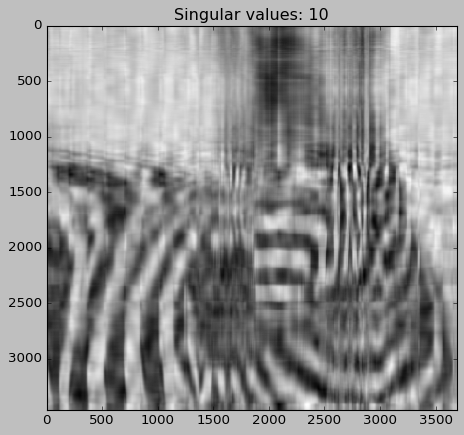

In [ ]:
i = 10
img_recons = np.matrix(U[:, :i]) * np.diag(D[:i]) * np.matrix(V[:i,:])
plt.imshow(img_recons, cmap="gray")

title_v = "Singular values: %s" %i

plt.title(title_v)
plt.show()

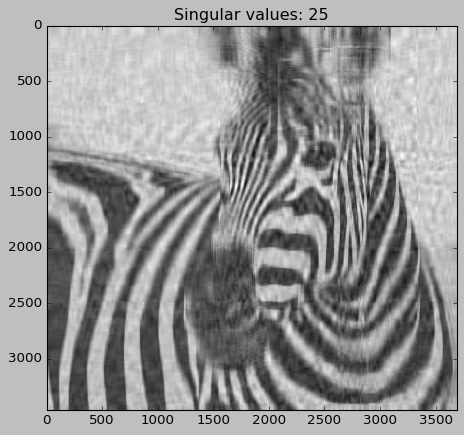

In [ ]:
i = 25
img_recons = np.matrix(U[:, :i]) * np.diag(D[:i]) * np.matrix(V[:i,:])
plt.imshow(img_recons, cmap="gray")

title_v = "Singular values: %s" %i

plt.title(title_v)
plt.show()

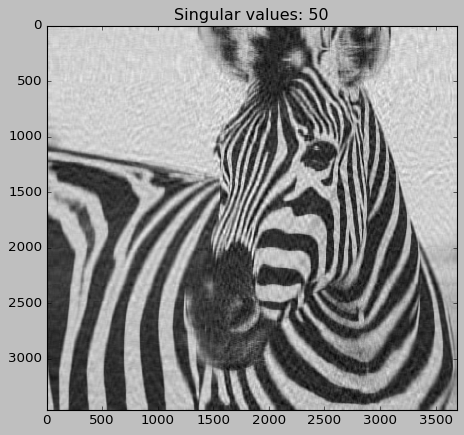

In [ ]:
i = 50
img_recons = np.matrix(U[:, :i]) * np.diag(D[:i]) * np.matrix(V[:i,:])
plt.imshow(img_recons, cmap="gray")

title_v = "Singular values: %s" %i

plt.title(title_v)
plt.show()

# Moore Penrose Pseudo Inverse

In [ ]:
np.set_printoptions(suppress=True)

In [ ]:
A = np.array([[2,3], [5,7], [11,13]])
print(A)

[[ 2  3]
 [ 5  7]
 [11 13]]


In [ ]:
U, D, V = np.linalg.svd(A)
print("U")
print(U)
print("D")
print(D)
print("V")
print(V)

U
[[-0.18499741 -0.47276624 -0.86154979]
 [-0.44249308 -0.74271297  0.50257071]
 [-0.87748267  0.4742041  -0.07179582]]
D
[19.40321383  0.71783924]
V
[[-0.63055377 -0.77614557]
 [ 0.77614557 -0.63055377]]


In [ ]:
D_pse = np.zeros((A.shape[0], A.shape[1])).T
print(D_pse)

[[0. 0. 0.]
 [0. 0. 0.]]


In [ ]:
print("Values to replace in D_pse")
print(D_pse[:D.shape[0], :D.shape[0]])

Values to replace in D_pse
[[0. 0.]
 [0. 0.]]


In [ ]:
print("Values to be set in D_pse")
print(np.linalg.inv(np.diag(D)))

Values to be set in D_pse
[[0.05153785 0.        ]
 [0.         1.39306957]]


In [ ]:
print("D_pse")
D_pse[:D.shape[0], :D.shape[0]] = np.linalg.inv(np.diag(D))
print(D_pse)

D_pse
[[0.05153785 0.         0.        ]
 [0.         1.39306957 0.        ]]


In [ ]:
A_pse = V.T.dot(D_pse).dot(U.T)
print(A_pse)

[[-0.50515464 -0.78865979  0.54123711]
 [ 0.42268041  0.67010309 -0.3814433 ]]


In [ ]:
A_pse_calc = np.linalg.pinv(A)
print(A_pse)

[[-0.50515464 -0.78865979  0.54123711]
 [ 0.42268041  0.67010309 -0.3814433 ]]


In [ ]:
print(A_pse.dot(A))

[[ 1. -0.]
 [ 0.  1.]]


In [ ]:
np.set_printoptions(suppress=False)
print(A_pse.dot(A))

[[ 1.00000000e+00 -1.77635684e-15]
 [ 4.44089210e-16  1.00000000e+00]]


In [ ]:
print(A.dot(A_pse))

[[ 0.25773196  0.43298969 -0.06185567]
 [ 0.43298969  0.74742268  0.03608247]
 [-0.06185567  0.03608247  0.99484536]]


In [ ]:
A_pse_2 = np.linalg.inv(A.T.dot(A)).dot(A.T)
print(A_pse_2)

[[-0.50515464 -0.78865979  0.54123711]
 [ 0.42268041  0.67010309 -0.3814433 ]]


In [ ]:
print(A_pse)

[[-0.50515464 -0.78865979  0.54123711]
 [ 0.42268041  0.67010309 -0.3814433 ]]


# Solving Overdeterminated Systems

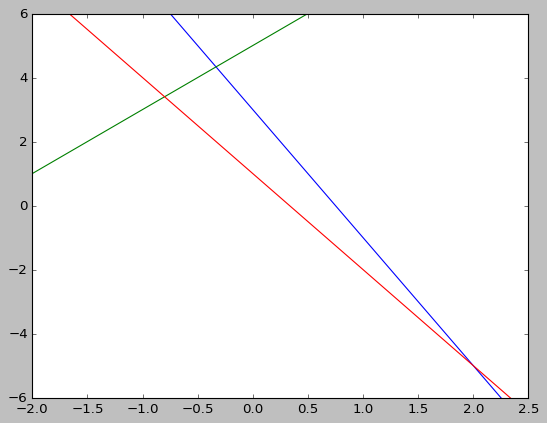

In [ ]:
x = np.linspace(-5, 5, 1000)
y_1 = -4*x + 3
y_2 = 2*x + 5
y_3 = -3*x + 1

plt.plot(x, y_1)
plt.plot(x, y_2)
plt.plot(x, y_3)

plt.xlim(-2, 2.5)
plt.ylim(-6, 6)

plt.show()

In [ ]:
matrix = np.array([[4,1], [-2,1], [3,1]])
print(matrix)

[[ 4  1]
 [-2  1]
 [ 3  1]]


In [ ]:
matrix_pse = np.linalg.pinv(matrix)
print(matrix_pse)

[[ 0.11290323 -0.17741935  0.06451613]
 [ 0.14516129  0.62903226  0.22580645]]


In [ ]:
b = np.array([[3], [5], [1]])
print(b)

[[3]
 [5]
 [1]]


In [ ]:
result = matrix_pse.dot(b)
print(result)

[[-0.48387097]
 [ 3.80645161]]


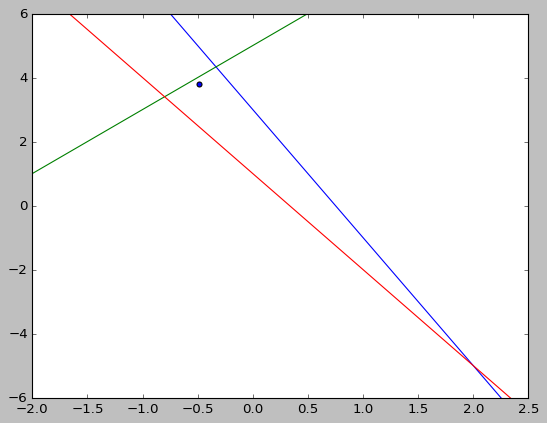

In [ ]:
plt.plot(x, y_1)
plt.plot(x, y_2)
plt.plot(x, y_3)

plt.xlim(-2, 2.5)
plt.ylim(-6, 6)

plt.scatter(result[0], result[1])

plt.show()